In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, MinMaxScaler
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import statsmodels.api as sm
%pylab inline
%config InlineBackend.figure_formats = ['retina']

Populating the interactive namespace from numpy and matplotlib


In [2]:
# Importing the web-scrapped df:

recipes_df = pd.read_csv('recipes_df.csv')

In [3]:
# Dropping of the artifact column:

recipes_df.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
# Homogenizing the name column entries:

recipes_df['recipe'] = recipes_df['recipe'].str.split('|', expand=True)[0]

In [5]:
recipes_df.describe()

,rating,rating_num,review_num,calories,protein,carbs,diet_fiber,sugars,fat,sat_fat,...,vit_B6,vit_C,folate,calcium,iron,magnesium,potassium,sodium,thiamin,calories_fat
count,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,...,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000,1496.000000
mean,4.528133,487.607620,347.320187,452.367313,28.988168,29.717848,2.697193,6.753075,23.969652,8.857086,...,0.515174,17.659291,60.339973,141.285628,3.347059,51.400267,561.261430,960.878476,0.322928,215.721324
std,0.208458,860.013069,603.168434,223.381421,14.166563,24.582331,2.518394,8.578606,16.883977,6.797107,...,0.343526,30.587712,63.273826,153.627209,2.984984,29.199305,348.068121,916.983431,0.293341,151.957846
min,3.333333,1.000000,0.000000,81.900000,3.900000,0.300000,0.100000,0.100000,1.500000,0.300000,...,0.100000,0.100000,0.600000,7.100000,0.300000,7.100000,72.300000,27.400000,0.100000,13.300000
25%,4.394521,57.750000,41.000000,311.550000,20.500000,11.500000,0.800000,1.700000,14.200000,4.100000,...,0.300000,2.100000,17.100000,42.400000,2.000000,31.600000,340.700000,490.775000,0.100000,127.975000
50%,4.545023,190.000000,138.000000,419.750000,26.900000,25.100000,2.000000,4.100000,20.950000,7.300000,...,0.400000,6.400000,39.500000,81.100000,2.850000,44.600000,486.850000,790.550000,0.200000,188.600000
75%,4.666341,537.250000,390.500000,546.875000,34.800000,41.750000,3.800000,8.100000,30.625000,12.025000,...,0.700000,19.000000,84.225000,172.775000,4.000000,64.200000,684.700000,1196.900000,0.400000,275.900000
max,5.000000,10221.000000,7211.000000,4709.200000,273.200000,340.200000,20.300000,102.000000,383.900000,103.400000,...,6.000000,507.300000,731.300000,1043.900000,54.700000,330.800000,6063.200000,22099.400000,2.200000,3455.300000


### Calculated calories for each recipe have an almost perfect correlation with ingredients amounts. Therefore calorie column was used to remove outliers.

In [6]:
# Removal of the very high and very low calorie recipes: 

recipes_df.drop(recipes_df[recipes_df['calories']>1000].index, inplace=True)
recipes_df.drop(recipes_df[recipes_df['calories']<100].index, inplace=True)
recipes_df.reset_index(inplace=True)
recipes_df.drop(columns=['index'], inplace=True)

### Features and target pairplots:

In [7]:
sns.pairplot(recipes_df[:500], plot_kws=dict(alpha=.1, edgecolor='none'))

In [8]:
# Removal of irrelevant columns and seperation of target and features:

y = recipes_df['rating']
X = recipes_df[['protein','carbs', 'diet_fiber'
                , 'sugars', 'fat', 'sat_fat'
                , 'cholesterol', 'vit_A'
                , 'niacin_eq', 'vit_B6', 'vit_C'
                , 'folate', 'calcium', 'iron'
                , 'magnesium', 'potassium', 'sodium', 'thiamin']]

### Division of the data to test and train portions: 

In [9]:
X_rest, X_test, y_rest, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
corr_mat = X_rest.corr(method='pearson')
corr_mat

,protein,carbs,diet_fiber,sugars,fat,sat_fat,cholesterol,vit_A,niacin_eq,vit_B6,vit_C,folate,calcium,iron,magnesium,potassium,sodium,thiamin
protein,1.000000,0.046423,0.015683,0.017869,0.335506,0.251293,0.631932,0.045729,0.824339,0.672913,-0.006088,0.095288,0.182271,0.312092,0.513025,0.480536,0.283211,0.207236
carbs,0.046423,1.000000,0.545115,0.338690,0.115379,0.134515,-0.018102,0.173859,0.054180,0.003011,0.160864,0.582940,0.270757,0.332229,0.374866,0.248870,0.201986,0.236563
diet_fiber,0.015683,0.545115,1.000000,0.091601,0.079327,0.104227,-0.114820,0.360499,-0.013676,0.121328,0.432882,0.543461,0.361960,0.312343,0.581959,0.513372,0.140329,0.090900
sugars,0.017869,0.338690,0.091601,1.000000,0.016395,-0.002689,-0.032816,0.028659,0.032733,0.073075,0.078370,-0.043654,0.014430,0.016100,0.077706,0.171778,0.246751,0.126284
fat,0.335506,0.115379,0.079327,0.016395,1.000000,0.831313,0.410582,0.041387,0.154136,0.103955,-0.022407,0.080835,0.292453,0.173312,0.202966,0.199515,0.181201,0.055214
sat_fat,0.251293,0.134515,0.104227,-0.002689,0.831313,1.000000,0.427104,0.076665,0.078059,-0.022180,-0.033815,0.132469,0.461482,0.152710,0.185735,0.142164,0.154871,0.015248
cholesterol,0.631932,-0.018102,-0.114820,-0.032816,0.410582,0.427104,1.000000,0.103640,0.476949,0.312018,-0.072718,0.108211,0.126307,0.230014,0.260917,0.200662,0.124006,0.104923
vit_A,0.045729,0.173859,0.360499,0.028659,0.041387,0.076665,0.103640,1.000000,0.075990,0.214038,0.259346,0.292064,0.121274,0.167611,0.296491,0.324385,-0.027716,0.028921
niacin_eq,0.824339,0.054180,-0.013676,0.032733,0.154136,0.078059,0.476949,0.075990,1.000000,0.748508,-0.001279,0.137981,0.014274,0.206261,0.444069,0.382252,0.209857,0.238962
vit_B6,0.672913,0.003011,0.121328,0.073075,0.103955,-0.022180,0.312018,0.214038,0.748508,1.000000,0.266475,0.069913,-0.095018,0.126468,0.537382,0.632655,0.149648,0.349126


### Initial OLS model:

In [11]:
lr_model = LinearRegression()
lr_model.fit(X_rest, y_rest)
lr_model.score(X_rest, y_rest)

0.06612998166755824

In [12]:
model = sm.OLS(y_rest, sm.add_constant(X_rest)) 
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     4.556
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           9.40e-10
Time:                        12:05:04   Log-Likelihood:                 238.44
No. Observations:                1177   AIC:                            -438.9
Df Residuals:                    1158   BIC:                            -342.5
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           4.4977      0.018    246.688      0.000       4.462       4.533
protein         0.0020      0.001      1.662      0.097      -0.000       0.004
carbs          -0.0007      0.000     -1.907      0.057      -0.001    2.01e-05
diet_fiber      0.0021      0.004      0.526      0.599      -0.006       0.010
sugars          0.0009      0.001      1.083      0.279      -0.001       0.002
fat             0.0009      0.001      0.973      0.331      -0.001       0.003
sat_fat        -0.0047      0.002     -2.259      0.024      -0.009      -0.001
cholesterol     0.0008      0.000      4.845      0.000       0.000       0.001
vit_A        5.558e-06   2.55e-06      2.179      0.030    5.54e-07    1.06e-05
niacin_eq      -0.0088      0.002     -4.596      0.000      -0.013      -0.005
vit_B6          0.0750      0.044      1.708      0.088      -0.011       0.161
vit_C          -0.0004      0.000     -1.322      0.187      -0.001       0.000
folate      -9.445e-05      0.000     -0.587      0.557      -0.000       0.000
calcium      1.066e-05    5.2e-05      0.205      0.838   -9.14e-05       0.000
iron            0.0029      0.003      1.129      0.259      -0.002       0.008
magnesium       0.0008      0.000      1.838      0.066   -5.09e-05       0.002
potassium      -0.0001   3.68e-05     -3.193      0.001      -0.000   -4.53e-05
sodium       1.358e-05   8.93e-06      1.521      0.128   -3.93e-06    3.11e-05
thiamin         0.0099      0.024      0.413      0.680      -0.037       0.057
==============================================================================
Omnibus:                        5.117   Durbin-Watson:                   1.953
Prob(Omnibus):                  0.077   Jarque-Bera (JB):                5.185
Skew:                          -0.160   Prob(JB):                       0.0748
Kurtosis:                       2.937   Cond. No.                     2.30e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.3e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Feature engineering and addition (mainly based on the shape of the relationship between features and target from the pairplots):

In [13]:
# To keep as the original DF:

X_rest2 = X_rest.copy()

In [14]:
# Addition of new features:

X_rest2['pro_log'] = log10(X_rest2['protein'])
X_rest2['sod_log'] = log10(X_rest2['sodium'])
X_rest2['iron_log'] = log10(X_rest2['iron'])
X_rest2['fat_sqrt'] = (X_rest2['fat'])**(0.5) 
X_rest2['fat_2'] = (X_rest2['fat'])**2 
X_rest2['sug_log'] = log10(X_rest2['sugars'])
X_rest2['sug_to_carb'] = X_rest2['sugars']/X_rest2['carbs']
X_rest2['vit_A_sqrt'] = X_rest2['vit_A']**(0.5)
X_rest2['fat_log'] = log10(X_rest2['fat'])
X_rest2['sod_2'] = (X_rest2['sodium'])**2
X_rest2['chol_log'] = X_rest2['cholesterol']**(0.5)
X_rest2['pro_niacin'] = X_rest2['protein']*X_rest2['niacin_eq']


# X_rest2['pro_fiber'] = X_rest2['protein']*X_rest2['diet_fiber']
# X_rest2['chol_to_fat'] = X_rest2['cholesterol']/X_rest2['fat']
# X_rest2['vit_A_2'] = X_rest2['vit_A']**(2)
# X_rest2['pro_iron'] = X_rest2['protein']*X_rest2['iron']
# X_rest2['vit_A_log'] = log10(X_rest2['vit_A'])
# X_rest2['pro_to_carb'] = X_rest2['protein']/X_rest2['carbs']
# X_rest2['pro_to_fat'] = X_rest2['protein']/X_rest2['fat']
# X_rest2['carb_to_fat'] = X_rest2['carbs']/X_rest2['fat']
# X_rest2['carb_log'] = log10(X_rest2['carbs'])
# X_rest2['chol_log'] = log10(X_rest2['cholesterol'])
# X_rest2['carb_sqrt'] = (X_rest2['carbs'])**(0.5)
# X_rest2['carb_sqrt'] = (X_rest2['carbs'])**(0.5)
# X_rest2['carb_3'] = (X_rest2['carbs'])**3
# X_rest2['A_C_fiber'] = X_rest2['vit_A']*X_rest2['vit_C']*X_rest2['diet_fiber']
# X_rest2['sat_to_fat'] = X_rest2['sat_fat']/X_rest2['fat']
# X_rest2['pro_carb_fat'] = X_rest2['protein']*X_rest2['carbs']*X_rest2['fat']

In [15]:
# Refitting the model on the initial + engineered features:

model = sm.OLS(y_rest, sm.add_constant(X_rest2)) 
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     4.672
Date:                Fri, 19 Nov 2021   Prob (F-statistic):           4.54e-15
Time:                        12:05:04   Log-Likelihood:                 266.08
No. Observations:                1177   AIC:                            -470.2
Df Residuals:                    1146   BIC:                            -313.0
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           4.3851      0.332     13.222      0.000       3.734       5.036
protein         0.0035      0.003      1.196      0.232      -0.002       0.009
carbs          -0.0005      0.000     -1.055      0.292      -0.001       0.000
diet_fiber      0.0055      0.004      1.342      0.180      -0.003       0.013
sugars          0.0015      0.001      1.271      0.204      -0.001       0.004
fat             0.0360      0.041      0.870      0.385      -0.045       0.117
sat_fat        -0.0054      0.002     -2.533      0.011      -0.010      -0.001
cholesterol     0.0004      0.001      0.746      0.456      -0.001       0.002
vit_A       -5.408e-06   5.96e-06     -0.907      0.365   -1.71e-05    6.29e-06
niacin_eq      -0.0093      0.003     -3.319      0.001      -0.015      -0.004
vit_B6          0.0768      0.044      1.759      0.079      -0.009       0.162
vit_C          -0.0004      0.000     -1.374      0.170      -0.001       0.000
folate       2.303e-05      0.000      0.142      0.887      -0.000       0.000
calcium     -1.858e-05   5.37e-05     -0.346      0.729      -0.000    8.68e-05
iron            0.0091      0.003      2.832      0.005       0.003       0.015
magnesium       0.0007      0.000      1.757      0.079   -8.34e-05       0.002
potassium      -0.0001    3.7e-05     -3.267      0.001      -0.000   -4.83e-05
sodium        7.94e-06   4.06e-05      0.195      0.845   -7.18e-05    8.77e-05
thiamin         0.0138      0.024      0.576      0.565      -0.033       0.061
pro_log        -0.1590      0.147     -1.080      0.280      -0.448       0.130
sod_log         0.1007      0.052      1.926      0.054      -0.002       0.203
iron_log       -0.1496      0.046     -3.277      0.001      -0.239      -0.060
fat_sqrt       -0.4918      0.478     -1.029      0.304      -1.430       0.446
fat_2          -0.0001      0.000     -0.813      0.416      -0.000       0.000
sug_log        -0.0477      0.022     -2.144      0.032      -0.091      -0.004
sug_to_carb     0.0758      0.053      1.437      0.151      -0.028       0.179
vit_A_sqrt      0.0018      0.001      2.292      0.022       0.000       0.003
fat_log         1.1565      0.839      1.378      0.168      -0.490       2.803
sod_2       -5.483e-09   5.56e-09     -0.986      0.324   -1.64e-08    5.43e-09
chol_log        0.0108      0.012      0.867      0.386      -0.014       0.035
pro_niacin   2.255e-05   5.01e-05      0.450      0.653   -7.57e-05       0.000
==============================================================================
Omnibus:                        2.566   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.277   Jarque-Bera (JB):                2.479
Skew:                          -0.110   Prob(JB):                        0.290
Kurtosis:                       3.043   Cond. N

In [16]:
# Storage of the new feature DF into a CSV file:

X_rest2.to_csv('X_rest2.csv')

In [17]:
X_modified = pd.read_csv('X_rest2.csv')

### This cell was used iteratively to play with the features and see the effect on the four different regression models. The current column line up is the final combination:

In [18]:
X_rest3 = X_modified[['protein', 'carbs', 'diet_fiber'
                , 'niacin_eq', 'iron', 'magnesium'
                , 'potassium', 'sodium', 'pro_log'
                , 'sod_log', 'iron_log', 'fat_sqrt'
                , 'sug_log', 'sug_to_carb', 'vit_A_sqrt'
                , 'fat_log', 'chol_log']].copy()

In [19]:
X_rest3.head()

,protein,carbs,diet_fiber,niacin_eq,iron,magnesium,potassium,sodium,pro_log,sod_log,iron_log,fat_sqrt,sug_log,sug_to_carb,vit_A_sqrt,fat_log,chol_log
0,17.6,29.6,2.9,8.0,2.0,45.4,872.5,1236.1,1.245513,3.092054,0.301030,3.521363,0.255273,0.060811,14.173920,1.093422,7.334848
1,28.8,17.3,0.3,13.9,1.0,29.9,342.7,994.0,1.459392,2.997386,0.000000,3.178050,1.086360,0.705202,11.458621,1.004321,8.865664
2,29.7,7.5,1.1,13.0,3.7,34.1,565.0,1190.0,1.472756,3.075547,0.568202,6.549809,0.431364,0.360000,25.436195,1.632457,14.103191
3,30.0,65.1,2.6,12.0,3.7,40.5,564.3,1216.2,1.477121,3.085005,0.568202,3.987480,1.214844,0.251920,12.405644,1.201397,8.203658
4,17.8,49.8,11.6,5.9,3.6,115.2,911.6,492.5,1.250420,2.692406,0.556303,2.428992,1.173186,0.299197,6.426508,0.770852,3.987480


### Division of the data to 5 CV portions and averaging the R^2 values across validation groups for 4 regression models:

In [20]:
# Division to CV portions:

kf = KFold(n_splits=5, shuffle=True, random_state = 42)

# Scaling the data:

scaler = MinMaxScaler()
X_rest_scaled = scaler.fit_transform(X_rest3)

# OLS:

lr_R2_scores = cross_val_score(LinearRegression(), X_rest3, y_rest, cv=kf).round(3)

# LASSO:

lasso_R2_scores = cross_val_score(Lasso(), X_rest_scaled, y_rest, cv=kf).round(3)

# Ridge:

ridge_R2_scores = cross_val_score(Ridge(), X_rest_scaled, y_rest, cv=kf).round(3)

# Elastic Net:

en_R2_scores = cross_val_score(ElasticNet(), X_rest_scaled, y_rest, cv=kf).round(3)

print(f'OLR mean cv R^2: {np.mean(lr_R2_scores):.3f} +- {np.std(lr_R2_scores):.3f}')
print(f'Lasso R mean cv R^2: {np.mean(lasso_R2_scores):.3f} +- {np.std(lasso_R2_scores):.3f}')
print(f'Ridge R mean cv R^2: {np.mean(ridge_R2_scores):.3f} +- {np.std(ridge_R2_scores):.3f}')
print(f'ElasticNet R mean cv R^2: {np.mean(en_R2_scores):.3f} +- {np.std(en_R2_scores):.3f}')

OLR mean cv R^2: 0.066 +- 0.048
Lasso R mean cv R^2: -0.001 +- 0.001
Ridge R mean cv R^2: 0.059 +- 0.032
ElasticNet R mean cv R^2: -0.001 +- 0.001


### No alpha was assigned to the above regularization methods. Now we find the optimum alpha (for R^2):

In [21]:
# For LASSO:

alpha = np.logspace(-4, 4, 1000)
param_grid_lasso = dict(alpha=alpha)
grid_lasso = GridSearchCV(Lasso(), param_grid=param_grid_lasso, scoring='r2', cv=kf)
grid_lasso_result = grid_lasso.fit(X_rest_scaled, y_rest)

print('Best Score: ', grid_lasso_result.best_score_)
print('Best Param: ', grid_lasso_result.best_params_)

Best Score:  0.06298015933704242
Best Param:  {'alpha': 0.0001}


In [22]:
# For Ridge:

alpha = np.logspace(-4, 4, 1000)
param_grid_ridge = dict(alpha=alpha)
grid_ridge = GridSearchCV(Ridge(), param_grid=param_grid_ridge, scoring='r2', cv=kf)
grid_ridge_result = grid_ridge.fit(X_rest_scaled, y_rest)

print('Best Score: ', grid_ridge_result.best_score_)
print('Best Param: ', grid_ridge_result.best_params_)

Best Score:  0.06714661753048126
Best Param:  {'alpha': 0.12796968682159415}


In [23]:
# For Elastic Net:

alpha = np.logspace(-4, 4, 1000)
param_grid_en = dict(alpha=alpha)
grid_en = GridSearchCV(ElasticNet(), param_grid=param_grid_en, scoring='r2', cv = kf)
grid_en_result = grid_en.fit(X_rest_scaled, y_rest)


print('Best Score: ', grid_en_result.best_score_)
print('Best Param: ', grid_en_result.best_params_)

Best Score:  0.06559834063297906
Best Param:  {'alpha': 0.0001}


### Introduction of the obtained alphas into the models: 

In [24]:
# OLS:

lr_R2_scores = cross_val_score(LinearRegression(), X_rest3, y_rest, cv=kf).round(3)

# LASSO:

lasso_R2_scores = cross_val_score(Lasso(alpha=0.0001), X_rest_scaled, y_rest, cv=kf).round(3)

# Ridge:

ridge_R2_scores = cross_val_score(Ridge(alpha=0.12796968682159415), X_rest_scaled, y_rest, cv=kf).round(3)

# Elastic Net:

en_R2_scores = cross_val_score(ElasticNet(alpha=0.0001), X_rest_scaled, y_rest, cv=kf).round(3)

print(f'OLR mean cv R^2: {np.mean(lr_R2_scores):.3f} +- {np.std(lr_R2_scores):.3f}')
print(f'Lasso R mean cv R^2: {np.mean(lasso_R2_scores):.3f} +- {np.std(lasso_R2_scores):.3f}')
print(f'Ridge R mean cv R^2: {np.mean(ridge_R2_scores):.3f} +- {np.std(ridge_R2_scores):.3f}')
print(f'ElasticNet R mean cv R^2: {np.mean(en_R2_scores):.3f} +- {np.std(en_R2_scores):.3f}')

OLR mean cv R^2: 0.066 +- 0.048
Lasso R mean cv R^2: 0.063 +- 0.041
Ridge R mean cv R^2: 0.067 +- 0.043
ElasticNet R mean cv R^2: 0.066 +- 0.042


### Ridge was selected as the model with the best predictive power and with the least chance of overfitting. In order to avoid overfitting further, the alpha was increased  from the optimal value to 1:

In [25]:
ridge_R2_scores = cross_val_score(Ridge(alpha=1), X_rest_scaled, y_rest, cv=kf).round(3)
print(f'Ridge R mean cv R^2: {np.mean(ridge_R2_scores):.3f} +- {np.std(ridge_R2_scores):.3f}')

Ridge R mean cv R^2: 0.059 +- 0.032


### The model then was fitted to the whole data:

In [26]:
lr_model_ridge = Ridge(alpha=1)
lr_model_ridge.fit(X_rest_scaled, y_rest)
ridge_preds = lr_model_ridge.predict(X_rest_scaled)
lr_model_score = lr_model_ridge.score(X_rest_scaled, y_rest)
lr_model_ridge_MAE = np.mean(np.abs(y_rest - ridge_preds))

print(f'Ridge LR training score: {lr_model_score:.3f}')
print(f'Ridge LR training MAE: {lr_model_ridge_MAE:.3f}')

Ridge LR training score: 0.082
Ridge LR training MAE: 0.155


### We now compare the sign of the coefficients and the correlations with target for each selected feature:

In [27]:
features = ['protein', 'carbs', 'diet_fiber'
                , 'niacin_eq', 'iron', 'magnesium'
                , 'potassium', 'sodium', 'pro_log'
                , 'sod_log', 'iron_log', 'fat_sqrt'
                , 'sug_log', 'sug_to_carb', 'vit_A_sqrt'
                , 'fat_log', 'chol_log']

In [28]:
rest_df = X_rest3.copy()

In [29]:
rest_df['rating'] = y_rest

In [30]:
all_corr_matrix = rest_df.corr(method='pearson')

In [31]:
all_corr_matrix

,protein,carbs,diet_fiber,niacin_eq,iron,magnesium,potassium,sodium,pro_log,sod_log,iron_log,fat_sqrt,sug_log,sug_to_carb,vit_A_sqrt,fat_log,chol_log,rating
protein,1.000000,0.046423,0.015683,0.824339,0.312092,0.513025,0.480536,0.283211,0.936474,0.253479,0.381475,0.329448,-0.013090,0.014734,0.075721,0.308143,0.646074,0.031907
carbs,0.046423,1.000000,0.545115,0.054180,0.332229,0.374866,0.248870,0.201986,0.053860,0.273184,0.431609,0.123148,0.416262,-0.224120,0.246898,0.125581,-0.043405,-0.005098
diet_fiber,0.015683,0.545115,1.000000,-0.013676,0.312343,0.581959,0.513372,0.140329,0.010183,0.195724,0.459900,0.088392,0.296783,-0.262413,0.460722,0.093612,-0.152362,0.013322
niacin_eq,0.824339,0.054180,-0.013676,1.000000,0.206261,0.444069,0.382252,0.209857,0.762545,0.163284,0.261970,0.147057,-0.007933,0.020719,0.069008,0.132342,0.484757,0.039182
iron,0.312092,0.332229,0.312343,0.206261,1.000000,0.360656,0.397986,0.125374,0.291386,0.161060,0.762631,0.178795,0.102272,-0.166509,0.227198,0.178075,0.215459,0.000169
magnesium,0.513025,0.374866,0.581959,0.444069,0.360656,1.000000,0.723551,0.201573,0.491213,0.224625,0.487509,0.206406,0.182426,-0.147177,0.377562,0.199564,0.247856,0.029418
potassium,0.480536,0.248870,0.513372,0.382252,0.397986,0.723551,1.000000,0.200334,0.449289,0.196877,0.458187,0.205555,0.262936,0.015113,0.383586,0.200425,0.198742,0.017697
sodium,0.283211,0.201986,0.140329,0.209857,0.125374,0.201573,0.200334,1.000000,0.253997,0.834228,0.223053,0.180125,0.282870,0.128091,0.014365,0.168562,0.126626,0.013789
pro_log,0.936474,0.053860,0.010183,0.762545,0.291386,0.491213,0.449289,0.253997,1.000000,0.259159,0.388022,0.344104,-0.000968,0.023886,0.066441,0.328233,0.653726,0.046696
sod_log,0.253479,0.273184,0.195724,0.163284,0.161060,0.224625,0.196877,0.834228,0.259159,1.000000,0.294847,0.217044,0.328174,0.068534,0.048434,0.204397,0.128841,0.012222


In [32]:
list(zip(features
         , lr_model_ridge.coef_.round(3)
         , all_corr_matrix['rating'].round(3)))

[('protein', 0.23, 0.032),
 ('carbs', -0.024, -0.005),
 ('diet_fiber', 0.052, 0.013),
 ('niacin_eq', -0.3, 0.039),
 ('iron', 0.194, 0.0),
 ('magnesium', 0.14, 0.029),
 ('potassium', -0.156, 0.018),
 ('sodium', -0.13, 0.014),
 ('pro_log', -0.134, 0.047),
 ('sod_log', 0.245, 0.012),
 ('iron_log', -0.173, 0.023),
 ('fat_sqrt', -0.257, 0.034),
 ('sug_log', -0.17, -0.004),
 ('sug_to_carb', 0.123, -0.005),
 ('vit_A_sqrt', 0.172, 0.069),
 ('fat_log', 0.27, 0.033),
 ('chol_log', 0.321, 0.024)]

### As can be seen above, there is a discrepancy in sign of the coefficient and that of the correlation value for some feature. This can be because of the very low correlation scores and the discrepancy can fall in the error margin. In order to keep the predictive power of the model and not to further reduce it, these features will be kept in the model. 

### Finally, the chosen model will be retrained on the whole dataset and then will be tested on the hold out test set. But first we have to transform the whole and the test datasets:

In [33]:
X2 = X.copy()

In [34]:
# Introduction of engineered columns to the whole dataset:

X2['pro_log'] = log10(X2['protein'])
X2['sod_log'] = log10(X2['sodium'])
X2['iron_log'] = log10(X2['iron'])
X2['fat_sqrt'] = (X2['fat'])**(0.5) 
X2['fat_2'] = (X2['fat'])**2 
X2['sug_log'] = log10(X2['sugars'])
X2['sug_to_carb'] = X2['sugars']/X2['carbs']
X2['vit_A_sqrt'] = X2['vit_A']**(0.5)
X2['fat_log'] = log10(X2['fat'])
X2['sod_2'] = (X2['sodium'])**2
X2['chol_log'] = X2['cholesterol']**(0.5)
X2['pro_niacin'] = X2['protein']*X2['niacin_eq']

In [35]:
X3 = X2[['protein', 'carbs', 'diet_fiber'
                , 'niacin_eq', 'iron', 'magnesium'
                , 'potassium', 'sodium', 'pro_log'
                , 'sod_log', 'iron_log', 'fat_sqrt'
                , 'sug_log', 'sug_to_carb', 'vit_A_sqrt'
                , 'fat_log', 'chol_log']].copy()

In [36]:
# Scaling the whole dataset:

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X3)

In [37]:
X_test2 = X_test.copy()

In [38]:
# Introduction of engineered columns to the test dataset:

X_test2['pro_log'] = log10(X_test2['protein'])
X_test2['sod_log'] = log10(X_test2['sodium'])
X_test2['iron_log'] = log10(X_test2['iron'])
X_test2['fat_sqrt'] = (X_test2['fat'])**(0.5) 
X_test2['fat_2'] = (X_test2['fat'])**2 
X_test2['sug_log'] = log10(X_test2['sugars'])
X_test2['sug_to_carb'] = X_test2['sugars']/X_test2['carbs']
X_test2['vit_A_sqrt'] = X_test2['vit_A']**(0.5)
X_test2['fat_log'] = log10(X_test2['fat'])
X_test2['sod_2'] = (X_test2['sodium'])**2
X_test2['chol_log'] = X_test2['cholesterol']**(0.5)
X_test2['pro_niacin'] = X_test2['protein']*X_test2['niacin_eq']

In [39]:
X_test3 = X_test2[['protein', 'carbs', 'diet_fiber'
                , 'niacin_eq', 'iron', 'magnesium'
                , 'potassium', 'sodium', 'pro_log'
                , 'sod_log', 'iron_log', 'fat_sqrt'
                , 'sug_log', 'sug_to_carb', 'vit_A_sqrt'
                , 'fat_log', 'chol_log']].copy()

In [40]:
# Scaling the test dataset:

scaler = MinMaxScaler()
X_test_scaled = scaler.fit_transform(X_test3)

In [41]:
# Retraining the Ridge model on the whole data and getting the scores on the test dataset:

lr_model_ridge = Ridge(alpha=1)
lr_model_ridge.fit(X_scaled, y)
ridge_preds_test = lr_model_ridge.predict(X_test_scaled)
lr_model_score_test = lr_model_ridge.score(X_test_scaled, y_test)
lr_model_ridge_MAE_test = np.mean(np.abs(y_test - ridge_preds_test))

print(f'Ridge LR test score: {lr_model_score_test:.3f}')
print(f'Ridge LR test MAE: {lr_model_ridge_MAE_test:.3f}')

Ridge LR test score: 0.059
Ridge LR test MAE: 0.162


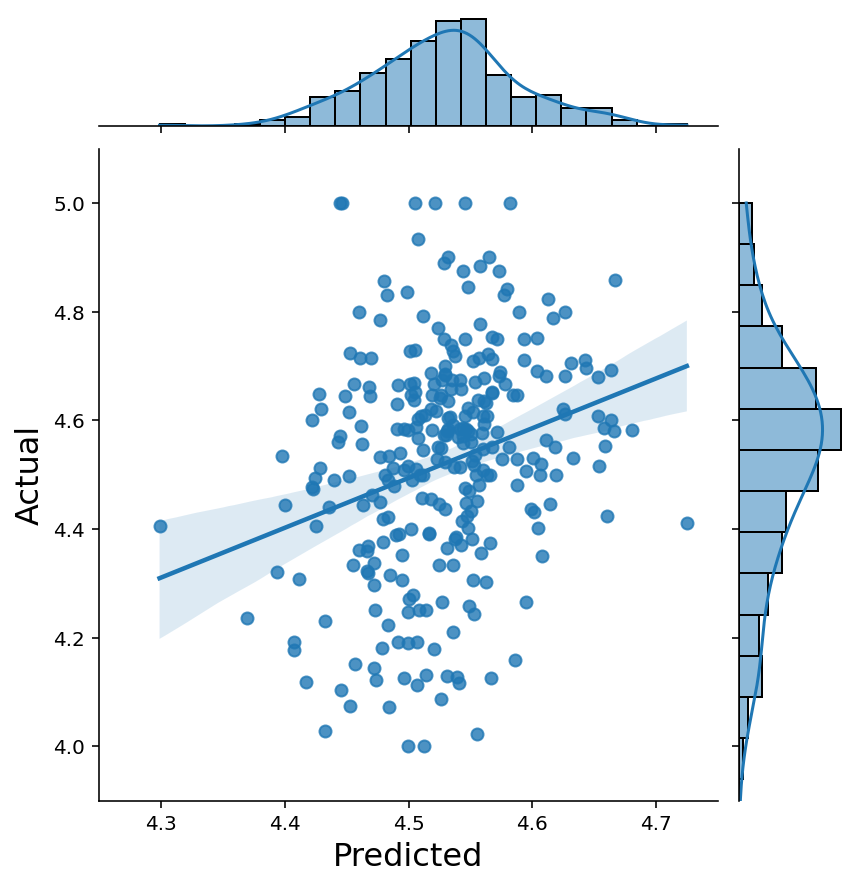

In [42]:
plot = sns.jointplot(x=ridge_preds_test,y=y_test, kind='reg')
plot.set_axis_labels('Predicted', 'Actual', fontsize=16)
plot.ax_marg_x.set_xlim(4.25, 4.75)
plot.ax_marg_y.set_ylim(3.9, 5.1)
plot.savefig("plot", bbox_inches='tight', dpi=600)